## Setup

In [1]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

from utils.general_utils import (PROJECT_ROOT, SPECIES_COLORS, SPECIES_ALL,
                                 species_label, target_config)

TARGET     = "photon"            # "pion" | "photon"
COMPARISON = "features"    # "architecture" | "features"
cfg = target_config(TARGET)

TRACKS_PATH = PROJECT_ROOT / "prepared" / "prepared-mc" / "test_tracks.pkl"
with open(TRACKS_PATH, "rb") as f:
    tracks = pickle.load(f)
species   = np.array([species_label(t) for t in tracks])
is_signal = np.array([cfg['is_signal'](t) for t in tracks])

PRED_DIR = PROJECT_ROOT / "predictions" / "predictions-mc"

# Explicit filenames rather than the promoted unsuffixed ones, so the notebook
# records exactly which models it used.
if COMPARISON == "architecture":
    MODELS = [
        ("CNN",    PRED_DIR / f"cnn_dEdX_seq{cfg['suffix']}.pkl"),
        ("MLP",    PRED_DIR / f"mlp_summary_base4{cfg['suffix']}.pkl"),
        ("Hybrid", PRED_DIR / f"hybrid_cnn_mlp_base4{cfg['suffix']}.pkl"),
    ]
    SUBTITLE = "identical inputs: the four original summary features"
else:
    MODELS = [
        ("Hybrid base4", PRED_DIR / f"hybrid_cnn_mlp_base4{cfg['suffix']}.pkl"),
        ("Hybrid all8",  PRED_DIR / f"hybrid_cnn_mlp_all8{cfg['suffix']}.pkl"),
    ]
    SUBTITLE = "same architecture, with and without the provenance features"

for name, path in MODELS:
    if not path.exists():
        raise SystemExit(f"missing: {path}\nHas train_classifier.py been run "
                         f"for this model/target/feature set?")

SHOW = SPECIES_ALL

OBS = [('track_score','track score',(0,1)),
       ('dEdX_median','median dE/dx [MeV/cm]',(0,6)),
       ('track_length','track length [cm]',(0,100)),
       ('track_chi2/ndof_proton','chi2/ndof (proton)',(0,100)),
       ('n_hits','n hits',(0,300)),
       ('sequence_length','sequence length',(0,222))]
OBSVALS = {key: np.array([float(t[key]) for t in tracks]) for key, _, _ in OBS}

PLOTS_DIR = PROJECT_ROOT / "plots" / "plot-scatter" / TARGET
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

print(f"target: {TARGET} ({cfg['signal_name']})")
print(f"comparison: {COMPARISON} — {SUBTITLE}")
print(f"models: {[n for n, _ in MODELS]}")

target: photon ($\gamma$ (beam $\pi^0$))
comparison: features — same architecture, with and without the provenance features
models: ['Hybrid base4', 'Hybrid all8']


## Scatter, pion/photon vs non-pion/non-photon

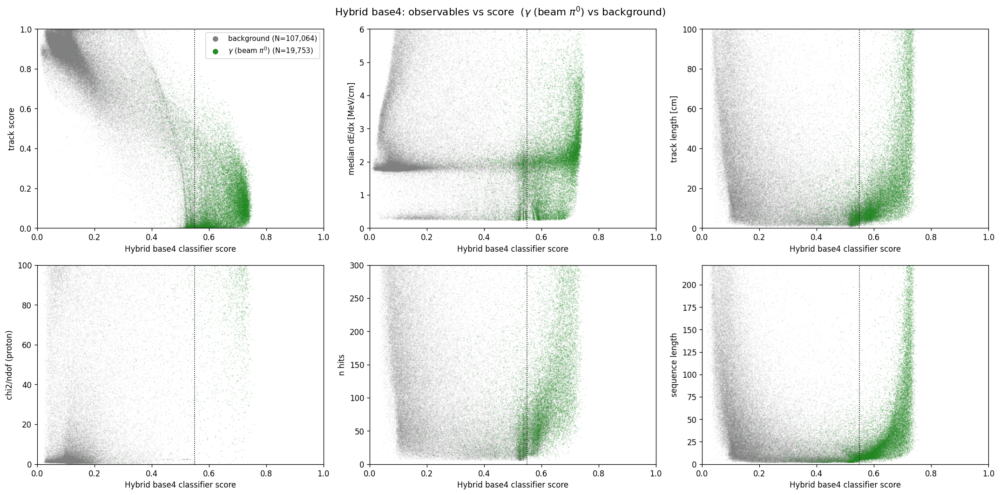

Saved /home/pemb7173/PDSP-pion-classification/plots/plot-scatter/photon/scatter_vs_score_Hybrid_base4_features_photon.pdf


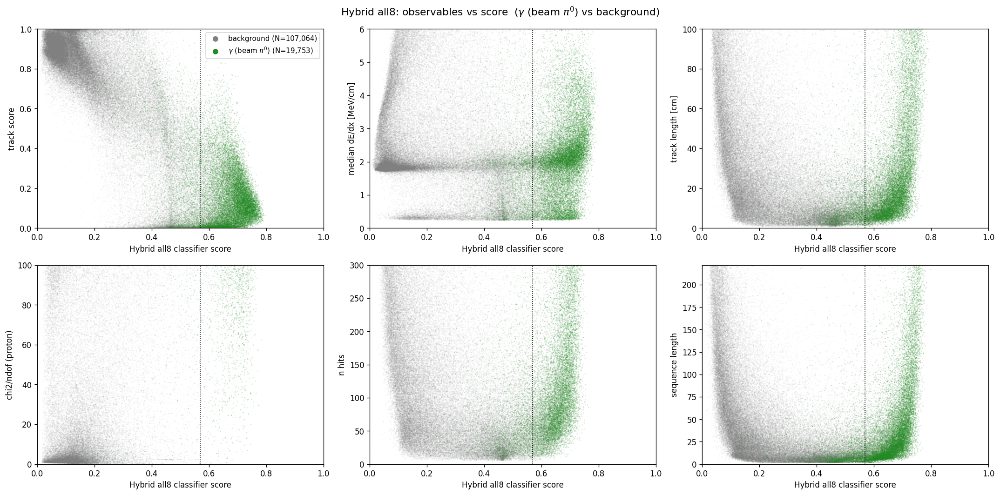

Saved /home/pemb7173/PDSP-pion-classification/plots/plot-scatter/photon/scatter_vs_score_Hybrid_all8_features_photon.pdf


In [2]:
# scatter plot: three figures (one per model), pion (blue) vs non-pion (grey)
for name, path in MODELS:
    with open(path, "rb") as f:
        d = pickle.load(f)
    
    probs = np.asarray(d["probs"]); labels = np.asarray(d["labels"]).astype(int); thr = d["threshold"]
    Nsig = int((labels == 1).sum()); Nbkg = int((labels == 0).sum())
    fig, ax = plt.subplots(2, 3, figsize=(18, 9), dpi=120); ax = ax.ravel()

    for j, (key, lab, rng) in enumerate(OBS):
        vals = OBSVALS[key]
        ax[j].scatter(probs[labels==0], vals[labels==0], s=2, alpha=0.08, color='grey',
                      edgecolors='none', rasterized=True, label=f"background (N={Nbkg:,})")
        ax[j].scatter(probs[labels==1], vals[labels==1], s=2, alpha=0.20, color=cfg['signal_colour'],
                      edgecolors='none', rasterized=True, label=f"{cfg['signal_name']} (N={Nsig:,})")
        ax[j].axvline(thr, color='k', ls=':', lw=1)
        ax[j].set_ylim(rng); ax[j].set_xlim(0,1)
        ax[j].set_xlabel(f'{name} classifier score'); ax[j].set_ylabel(lab)
    lg = ax[0].legend(fontsize=9, markerscale=5)

    for lh in getattr(lg, 'legend_handles', getattr(lg, 'legendHandles', [])):
        lh.set_alpha(1)
    
    fig.suptitle(f"{name}: observables vs score  ({cfg['signal_name']} vs background)", fontsize=13)
    plt.tight_layout()
    out_path = PLOTS_DIR / f"scatter_vs_score_{name.replace(' ', '_')}_{COMPARISON}_{TARGET}.pdf"

    plt.savefig(out_path, bbox_inches="tight")
    plt.show()
    print(f"Saved {out_path}")

## Scatter, coloured by species

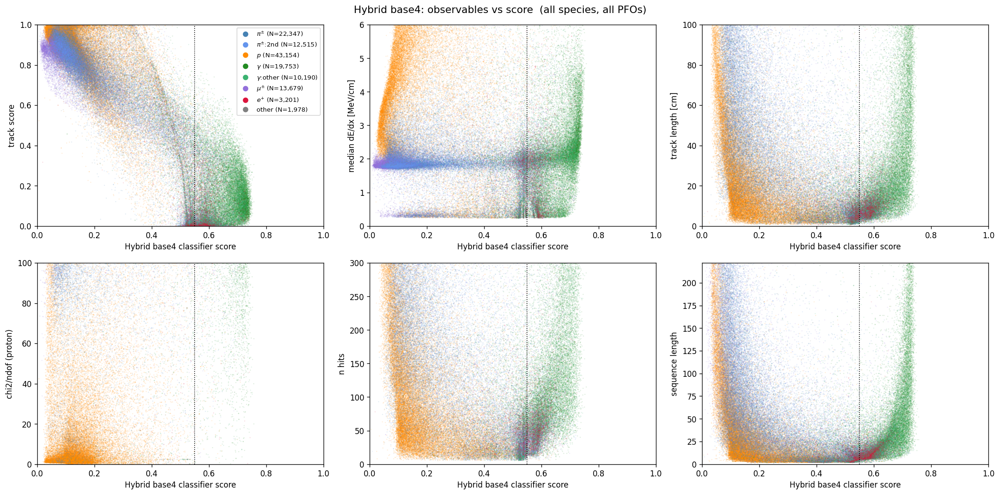

Saved /home/pemb7173/PDSP-pion-classification/plots/plot-scatter/photon/scatter_species_Hybrid_base4_features_photon.pdf


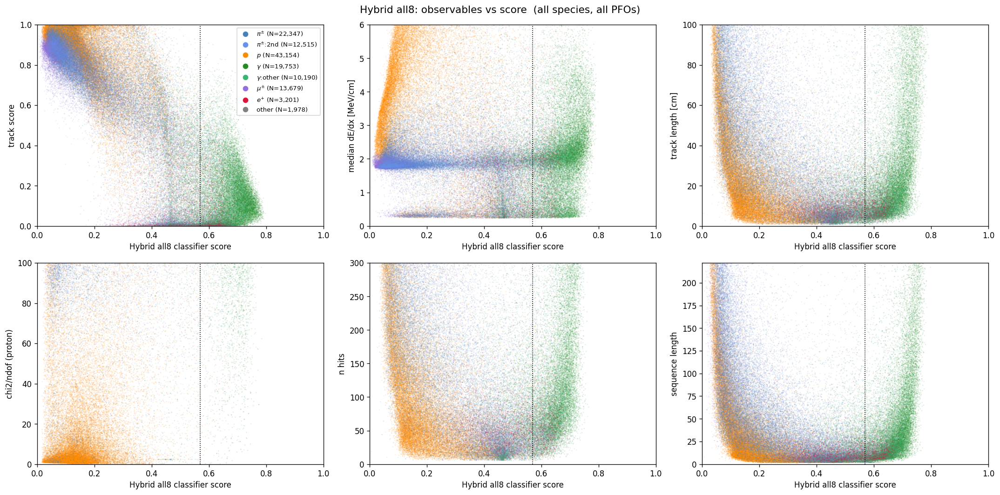

Saved /home/pemb7173/PDSP-pion-classification/plots/plot-scatter/photon/scatter_species_Hybrid_all8_features_photon.pdf


In [3]:
# scatter plot: three figures (one per model), coloured by species
counts = {sp: int((species == sp).sum()) for sp in SHOW}
DRAW = sorted(SHOW, key=lambda s: counts[s], reverse=True)   # abundant first (background)
handles = [Line2D([0],[0], marker='o', ls='', color=SPECIES_COLORS[s], ms=6, label=f"{s} (N={counts[s]:,})") for s in SHOW]

for name, path in MODELS:
    with open(path, "rb") as f:
        d = pickle.load(f)
    probs = np.asarray(d["probs"]); thr = d["threshold"]
    fig, ax = plt.subplots(2, 3, figsize=(18, 9), dpi=120); ax = ax.ravel()
    for j, (key, lab, rng) in enumerate(OBS):
        vals = OBSVALS[key]
        for sp in DRAW:
            m = species == sp
            ax[j].scatter(probs[m], vals[m], s=2, alpha=0.15, color=SPECIES_COLORS[sp],
                          edgecolors='none', rasterized=True)
        ax[j].axvline(thr, color='k', ls=':', lw=1)
        ax[j].set_ylim(rng); ax[j].set_xlim(0,1)
        ax[j].set_xlabel(f'{name} classifier score'); ax[j].set_ylabel(lab)
    ax[0].legend(handles=handles, fontsize=8)
    fig.suptitle(f"{name}: observables vs score  (all species, all PFOs)", fontsize=13)
    plt.tight_layout()
    out_path = PLOTS_DIR / f"scatter_species_{name.replace(' ', '_')}_{COMPARISON}_{TARGET}.pdf"
    plt.savefig(out_path, bbox_inches="tight")
    plt.show()
    print(f"Saved {out_path}")

## the four figures in one go

In [4]:
# Runs both comparisons for both targets without editing the switches by hand.
# Skips any combination whose prediction files do not exist yet.
import itertools

for tgt, comp in itertools.product(["pion", "photon"], ["architecture", "features"]):
    print(f"\n{'='*70}\n{tgt} / {comp}\n{'='*70}")
    print("Set TARGET and COMPARISON in cell 1 and re-run all")


pion / architecture
Set TARGET and COMPARISON in cell 1 and re-run all

pion / features
Set TARGET and COMPARISON in cell 1 and re-run all

photon / architecture
Set TARGET and COMPARISON in cell 1 and re-run all

photon / features
Set TARGET and COMPARISON in cell 1 and re-run all
